In [14]:
!pip install ./acosp/
!pip install ./segsem/

Processing ./acosp
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for acosp: filename=acosp-1.0.0-py3-none-any.whl size=13828 sha256=d9b053945a359da9a8acb791e83005c0e2e217b60031b8d0df6860147a50f4ca
  Stored in directory: /tmp/pip-ephem-wheel-cache-s_uvypst/wheels/a4/3c/53/91712c27ddcf1f70befa7b6c5efcc88b35cdbff1890ce41ddf
Successfully built acosp
  Attempting uninstall: acosp
    Found existing installation: acosp 1.0.0
    Uninstalling acosp-1.0.0:
      Successfully uninstalled acosp-1.0.0
ERROR: Invalid requirement: './segsem/'
Hint: It looks like a path. File './segsem/' does not exist.


In [23]:
# System libs
import os, csv, torch, numpy, scipy.io, PIL.Image, torchvision.transforms
# Our libs
from mit_semseg.models import ModelBuilder, SegmentationModule
from mit_semseg.utils import colorEncode

colors = scipy.io.loadmat('data/color150.mat')['colors']
names = {}
with open('data/object150_info.csv') as f:
    reader = csv.reader(f)
    next(reader)
    for row in reader:
        names[int(row[0])] = row[5].split(";")[0]

def visualize_result(img, pred, index=None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        pred[pred != index] = -1
        print(f'{names[index+1]}:')
        
    # colorize prediction
    pred_color = colorEncode(pred, colors).astype(numpy.uint8)

    # aggregate images and save
    im_vis = numpy.concatenate((img, pred_color), axis=1)
    display(PIL.Image.fromarray(im_vis))

In [15]:
def train(num_epoch=10, start_epoch=0, epoch_iters=100, cfg='config/ade20k-resnet50dilated-ppm_deepsup.yaml', prune=True, opts=''):
    if prune:
        !python3 train_prune.py --gpus 0 --cfg {cfg} TRAIN.num_epoch {num_epoch} TRAIN.start_epoch {start_epoch} TRAIN.epoch_iters {epoch_iters} {opts}
    else:
        !python3 train.py --gpus 0 --cfg {cfg} TRAIN.num_epoch {num_epoch} TRAIN.start_epoch {start_epoch} TRAIN.epoch_iters {epoch_iters} {opts}

In [6]:
def eval(cfg='config/ade20k-resnet50dilated-ppm_deepsup.yaml'):
    !python3 eval_multipro.py --gpus 0 --cfg {cfg}

In [9]:
def test(path, cfg='config/ade20k-resnet50dilated-ppm_deepsup.yaml'):
    !python3 -u test.py --imgs {path} --gpu 0 --cfg {cfg}

# Punning the model

In [31]:
train(epoch_iters=10)

/home/mjmaza/cv-project/train_prune.py:227: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  assert LooseVersion(torch.__version__) >= LooseVersion('0.4.0'), \
[2025-04-24 14:51:03,680 INFO train_prune.py line 258 6036] Loaded configuration file config/ade20k-resnet50dilated-ppm_deepsup.yaml
[2025-04-24 14:51:03,680 INFO train_prune.py line 259 6036] Running with config:
DATASET:
  imgMaxSize: 1000
  imgSizes: (300, 375, 450, 525, 600)
  list_train: ./data/training.odgt
  list_val: ./data/validation.odgt
  num_class: 150
  padding_constant: 8
  random_flip: True
  root_dataset: ./data/
  segm_downsampling_rate: 8
DIR: ckpt/ade20k-resnet50dilated-ppm_deepsup
MODEL:
  arch_decoder: ppm_deepsup
  arch_encoder: resnet50dilated
  fc_dim: 2048
  weights_decoder: 
  weights_encoder: 
TEST:
  batch_size: 1
  checkpoint: epoch_20.pth
  result: ./
TRAIN:
  batch_size_per_gpu: 2
  beta1: 0.9
  deep_sup_scale: 0.4
  disp_iter: 20
  epoch_iters: 10
  fi

In [36]:
net_encoder = ModelBuilder.build_encoder(
    arch='resnet50dilated',
    fc_dim=2048,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/encoder_epoch_10.pth')
net_decoder = ModelBuilder.build_decoder(
    arch='ppm_deepsup',
    fc_dim=2048,
    num_class=150,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/decoder_epoch_10.pth',
    use_softmax=True)

crit = torch.nn.NLLLoss(ignore_index=-1)
segmentation_module = SegmentationModule(net_encoder, net_decoder, crit)
segmentation_module.eval()
segmentation_module.cuda()

Loading weights for net_encoder
Loading weights for net_decoder


SegmentationModule(
  (encoder): ResnetDilated(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): SynchronizedBatchNorm2d(128, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): SynchronizedBatchNorm2d(64, eps=1

In [37]:
param_size = 0
for param in segmentation_module.parameters():
    param_size += param.nelement() * param.element_size()
buffer_size = 0
for buffer in segmentation_module.buffers():
    buffer_size += buffer.nelement() * buffer.element_size()

size_all_mb = (param_size + buffer_size) / 1024**2
print('model size: {:.3f}MB'.format(size_all_mb))

model size: 197.214MB


In [25]:
pil_to_tensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
        std=[0.229, 0.224, 0.225])  # across a large photo dataset.
])
pil_image = PIL.Image.open('ADE_val_00001519.jpg').convert('RGB')
img_original = numpy.array(pil_image)
img_data = pil_to_tensor(pil_image)
singleton_batch = {'img_data': img_data[None].cuda()}
output_size = img_data.shape[1:]

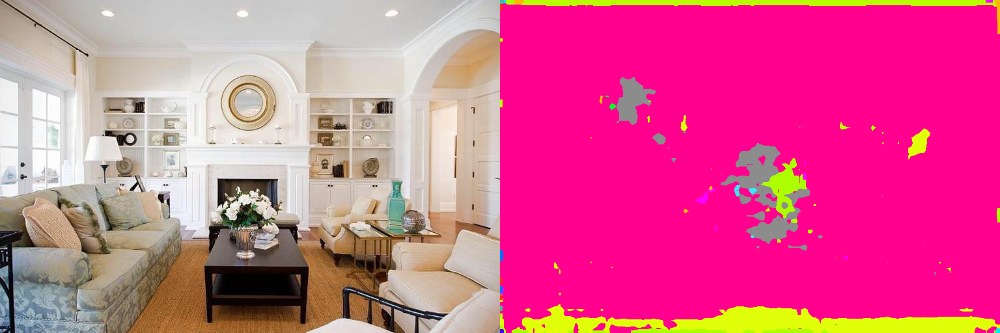

In [26]:
# Run the segmentation at the highest resolution.
with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)
    
# Get the predicted scores for each pixel
_, pred = torch.max(scores, dim=1)
pred = pred.cpu()[0].numpy()
visualize_result(img_original, pred)

step:


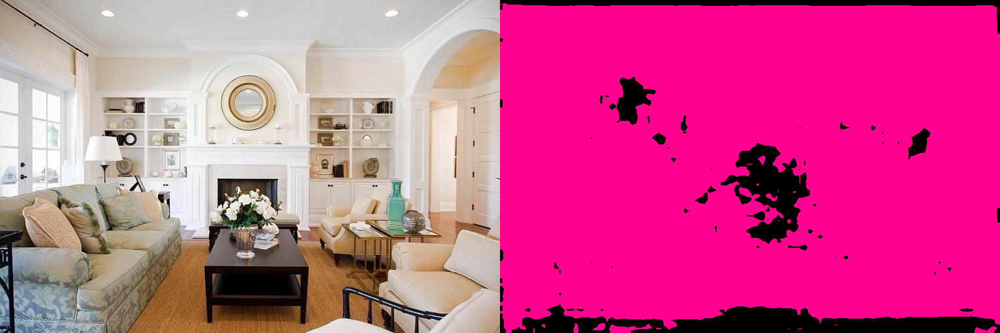

lamp:


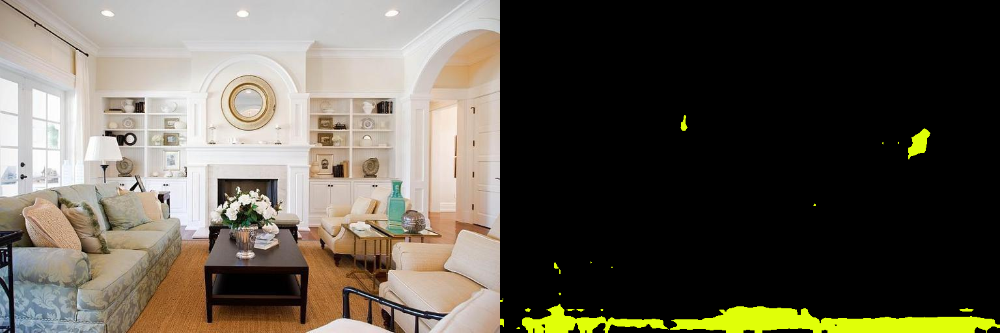

road:


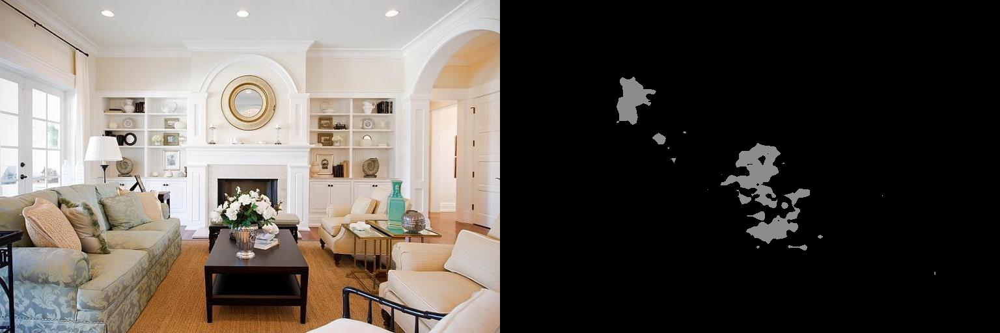

bulletin:


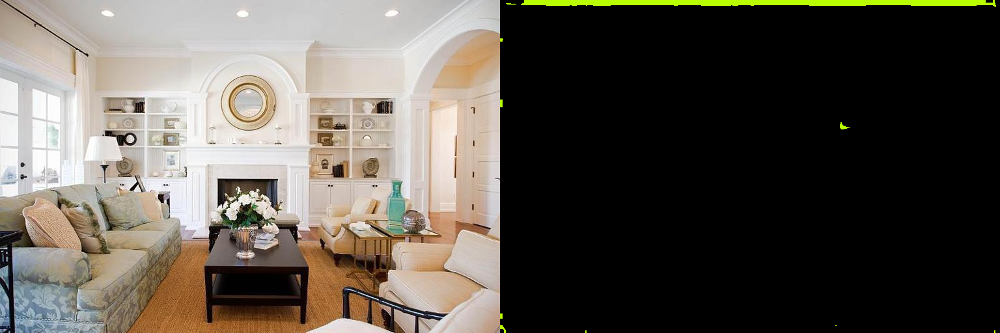

boat:


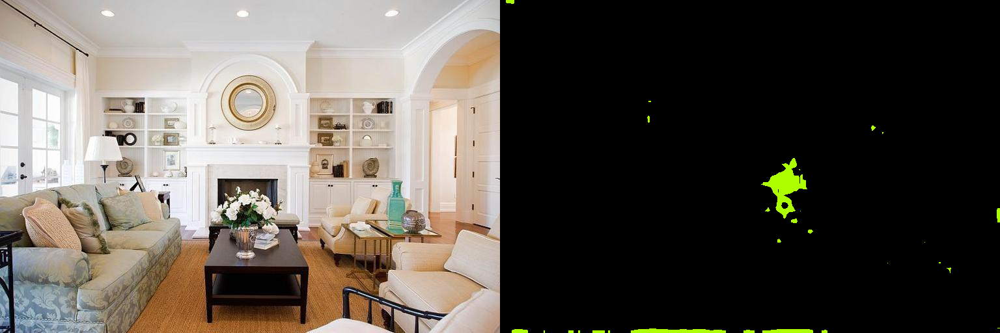

fence:


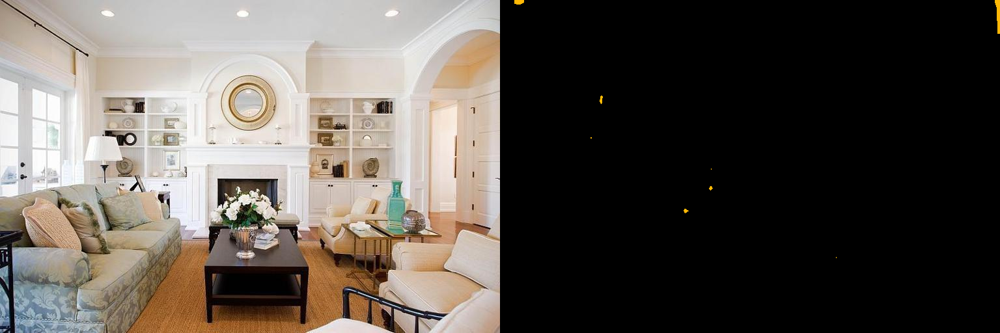

hovel:


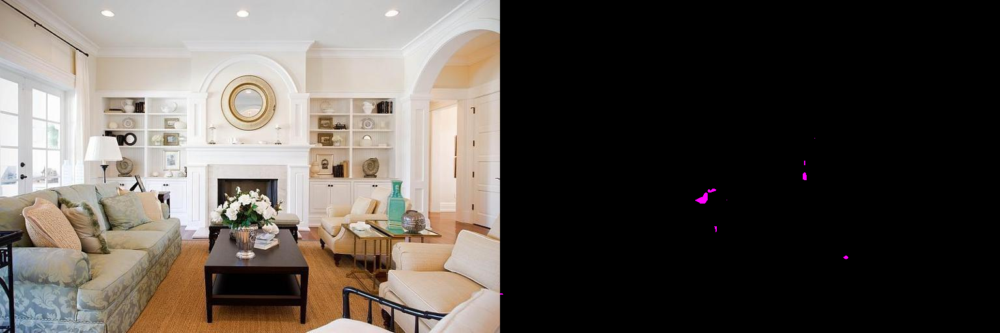

water:


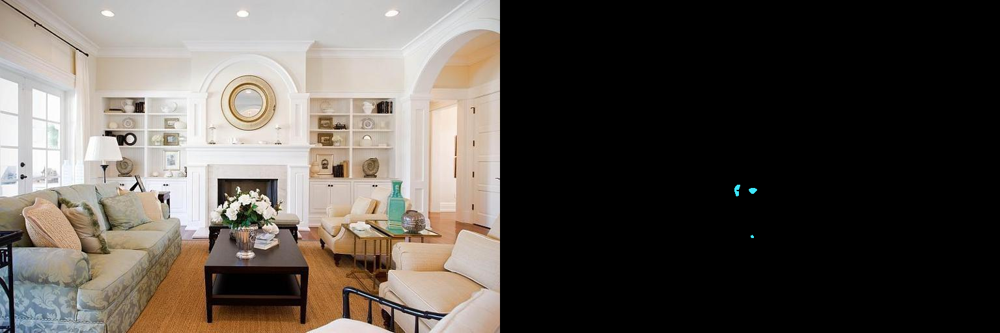

apparel:


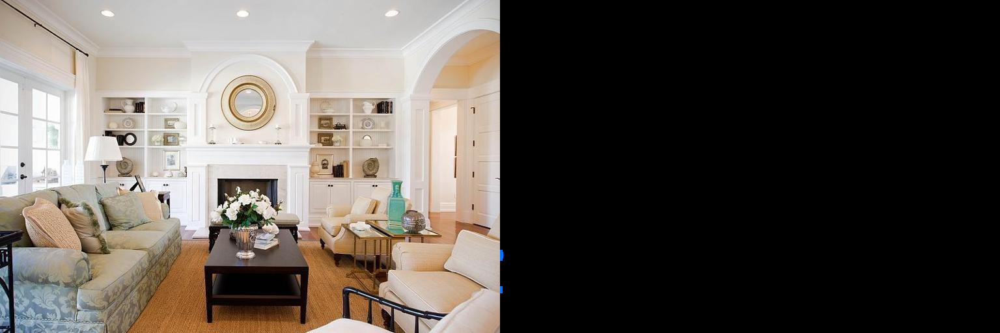

rock:


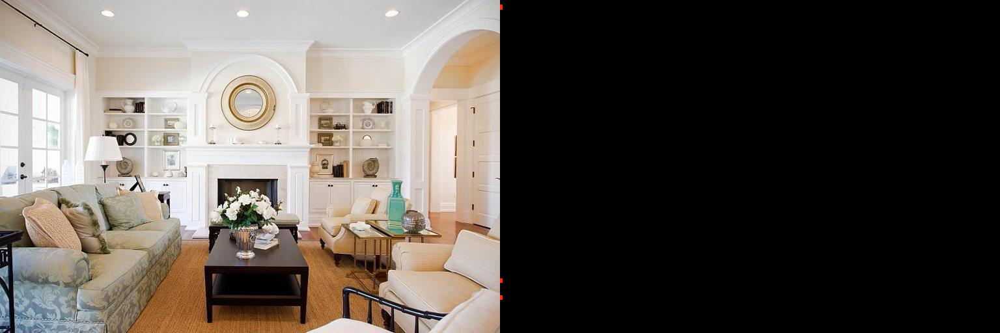

kitchen:


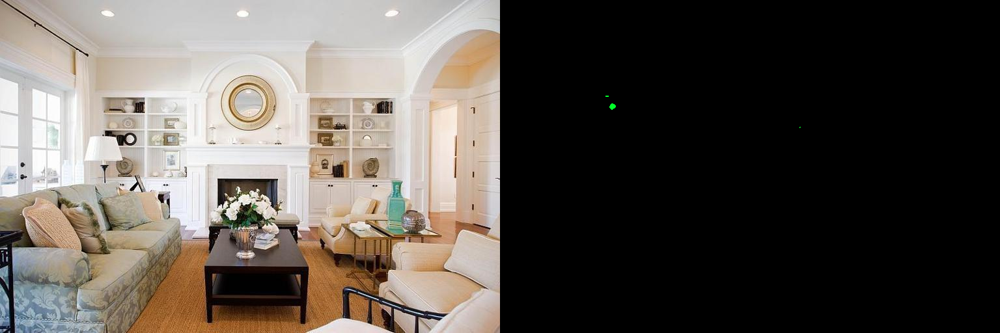

bag:


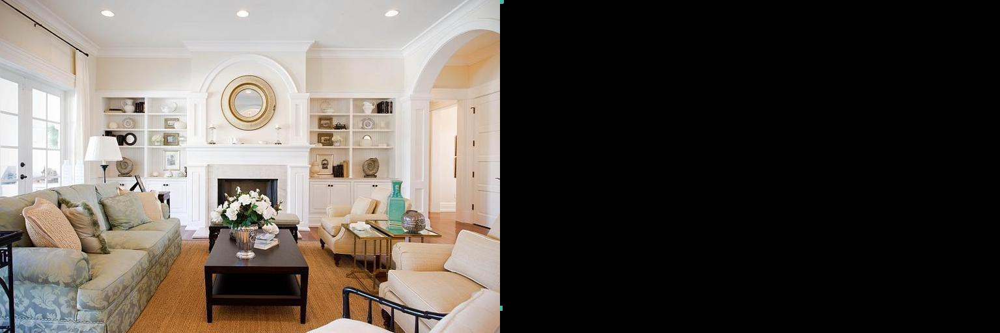

pot:


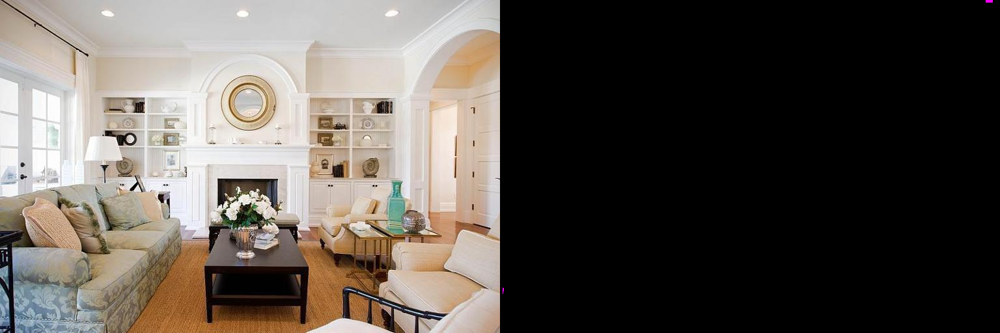

pillow:


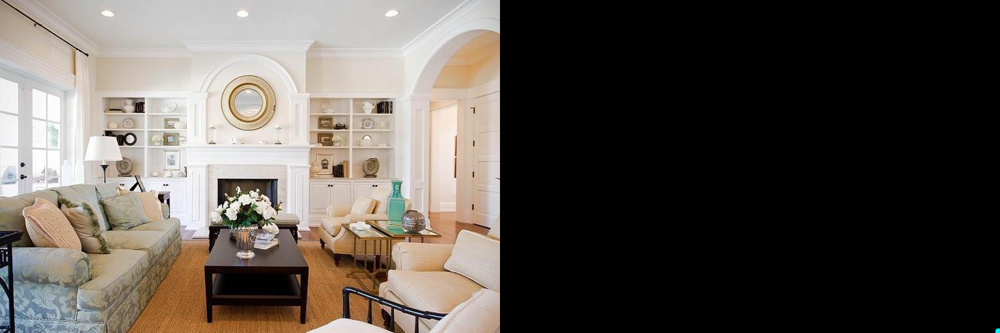

pier:


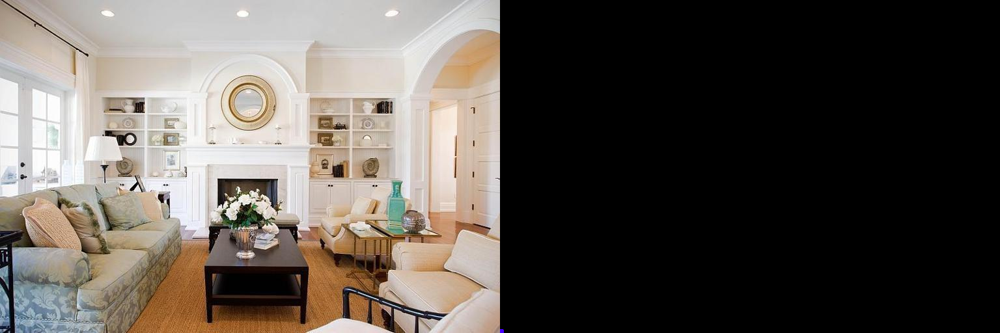

In [27]:
# Top classes in answer
predicted_classes = numpy.bincount(pred.flatten()).argsort()[::-1]
for c in predicted_classes[:15]:
    visualize_result(img_original, pred, c)